# ความสัมพันธ์ของ GDP per capita และ ตลาดหุ้น

In [1]:
import sys
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
print( f"Python {sys.version}\nPandas {pd.__version__}\nNumPy {np.__version__}" ) 

Python 3.9.12 (main, Apr  5 2022, 01:53:17) 
[Clang 12.0.0 ]
Pandas 1.4.2
NumPy 1.21.5


In [2]:
#import data stock by country
df_stock = pd.read_csv('/Users/planjeera/Downloads/Index_country.csv')  
df_stock.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 151 entries, 0 to 150
Data columns (total 32 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   country     151 non-null    object 
 1   name        151 non-null    object 
 2   1/1/2007    141 non-null    float64
 3   31/12/2007  143 non-null    float64
 4   1/1/2008    143 non-null    float64
 5   31/12/2008  147 non-null    float64
 6   1/1/2009    147 non-null    float64
 7   31/12/2009  147 non-null    float64
 8   1/1/2010    147 non-null    float64
 9   31/12/2010  149 non-null    float64
 10  1/1/2011    149 non-null    float64
 11  31/12/2011  149 non-null    float64
 12  1/1/2012    149 non-null    float64
 13  31/12/2012  149 non-null    float64
 14  1/1/2013    149 non-null    float64
 15  31/12/2013  151 non-null    float64
 16  1/1/2014    151 non-null    float64
 17  31/12/2014  151 non-null    float64
 18  1/1/2015    151 non-null    float64
 19  31/12/2015  151 non-null    f

In [3]:
#import name by country
df_name = pd.read_csv('/Users/planjeera/Downloads/csvData.csv')
df_name['country'] = df_name['country'].str.lower()
df_name = df_name.drop(['area','pop2022'],axis=1)
df_name

,country,region,subregion
0,china,Asia,Eastern Asia
1,india,Asia,Southern Asia
2,united states,North America,Northern America
3,indonesia,Asia,South-Eastern Asia
4,pakistan,Asia,Southern Asia
...,...,...,...
229,montserrat,North America,Caribbean
230,falkland islands,South America,South America
231,niue,Oceania,Polynesia
232,tokelau,Oceania,Polynesia


In [4]:
#import data GDPP by country
df_gdp = pd.read_csv('/Users/planjeera/Downloads/GDPP.csv')  
df_gdp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 266 entries, 0 to 265
Data columns (total 66 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Country Name    266 non-null    object 
 1   Country Code    266 non-null    object 
 2   Indicator Name  266 non-null    object 
 3   Indicator Code  266 non-null    object 
 4   1960            133 non-null    float64
 5   1961            135 non-null    float64
 6   1962            137 non-null    float64
 7   1963            137 non-null    float64
 8   1964            137 non-null    float64
 9   1965            148 non-null    float64
 10  1966            151 non-null    float64
 11  1967            155 non-null    float64
 12  1968            160 non-null    float64
 13  1969            160 non-null    float64
 14  1970            169 non-null    float64
 15  1971            172 non-null    float64
 16  1972            172 non-null    float64
 17  1973            172 non-null    flo

In [5]:
#clean data GDPP
df_gdp['Country Name'] = df_gdp['Country Name'].str.lower()
df_gdp = df_gdp.drop(['Country Code','Indicator Name','Indicator Code'],axis=1)
df_gdp = df_gdp.fillna(0)
df_gdp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 266 entries, 0 to 265
Data columns (total 63 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Country Name  266 non-null    object 
 1   1960          266 non-null    float64
 2   1961          266 non-null    float64
 3   1962          266 non-null    float64
 4   1963          266 non-null    float64
 5   1964          266 non-null    float64
 6   1965          266 non-null    float64
 7   1966          266 non-null    float64
 8   1967          266 non-null    float64
 9   1968          266 non-null    float64
 10  1969          266 non-null    float64
 11  1970          266 non-null    float64
 12  1971          266 non-null    float64
 13  1972          266 non-null    float64
 14  1973          266 non-null    float64
 15  1974          266 non-null    float64
 16  1975          266 non-null    float64
 17  1976          266 non-null    float64
 18  1977          266 non-null    

In [6]:
#find %change
year = 2005
while year <= 2019:
    df_gdp[int(year)+2] = df_gdp[[f'{int(year)+1}',f'{int(year)}']].apply(lambda x: ((x[f'{int(year)+1}']- x[f'{int(year)}'])/x[f'{int(year)}']*100) , axis=1)
    year+=1
df_gdp

/var/folders/r2/z52gb1f13kd2k3v2nyjr4hn00000gn/T/ipykernel_6721/3478735977.py:4: RuntimeWarning: invalid value encountered in double_scalars
  df_gdp[int(year)+2] = df_gdp[[f'{int(year)+1}',f'{int(year)}']].apply(lambda x: ((x[f'{int(year)+1}']- x[f'{int(year)}'])/x[f'{int(year)}']*100) , axis=1)
/var/folders/r2/z52gb1f13kd2k3v2nyjr4hn00000gn/T/ipykernel_6721/3478735977.py:4: RuntimeWarning: divide by zero encountered in double_scalars
  df_gdp[int(year)+2] = df_gdp[[f'{int(year)+1}',f'{int(year)}']].apply(lambda x: ((x[f'{int(year)+1}']- x[f'{int(year)}'])/x[f'{int(year)}']*100) , axis=1)
/var/folders/r2/z52gb1f13kd2k3v2nyjr4hn00000gn/T/ipykernel_6721/3478735977.py:4: RuntimeWarning: invalid value encountered in double_scalars
  df_gdp[int(year)+2] = df_gdp[[f'{int(year)+1}',f'{int(year)}']].apply(lambda x: ((x[f'{int(year)+1}']- x[f'{int(year)}'])/x[f'{int(year)}']*100) , axis=1)
/var/folders/r2/z52gb1f13kd2k3v2nyjr4hn00000gn/T/ipykernel_6721/3478735977.py:4: RuntimeWarning: invalid 

,Country Name,1960,1961,1962,1963,1964,1965,1966,1967,1968,...,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
0,aruba,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,7.108049,-1.366037,3.708627,1.711758,5.592079,0.192490,3.144417,3.084647,2.915907,-24.895987
1,africa eastern and southern,162.726326,162.555968,172.271022,199.784916,180.228774,199.517227,211.054388,213.636599,226.621320,...,9.072623,-1.818842,-1.597833,-0.724074,-10.362941,-7.054018,12.641991,-5.423615,-1.928734,-9.953662
2,afghanistan,59.773234,59.860900,58.458009,78.706429,82.095307,101.108325,137.594298,160.898434,129.108311,...,8.813350,8.060999,-2.274476,-1.616508,-9.478005,-7.912567,0.911517,-6.002062,1.752416,4.566868
3,africa western and central,107.930722,113.080062,118.829461,123.441090,131.852423,138.524029,144.323882,128.578957,129.641093,...,10.356587,5.517213,9.789695,2.568698,-14.396943,-11.638909,-3.605665,5.617958,4.325778,-3.829827
4,angola,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,29.169420,10.183470,2.998589,-0.655358,-38.597926,-44.754342,33.865092,9.152690,-13.748569,-25.088051
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261,kosovo,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,17.654826,-3.672295,8.617312,5.341520,-9.785838,6.782438,6.644946,9.344782,0.731275,-2.384388
262,"yemen, rep.",0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,2.984488,5.231627,11.103467,4.159556,-4.312742,-28.035156,-16.343495,-21.381911,-1.001307,-15.838034
263,south africa,511.618737,526.461750,546.261935,589.160460,632.716104,674.186433,714.562010,775.297687,817.719079,...,8.123360,-6.681852,-9.183897,-6.405054,-10.430519,-8.033336,16.223374,4.695238,-5.429384,-14.625344
264,zambia,232.188565,220.042067,212.578449,213.896759,242.384472,303.281741,343.373670,360.201239,409.775349,...,12.316448,5.389533,6.538447,-6.171331,-24.065490,-4.295358,19.861706,-1.226436,-13.939050,-24.510984


In [7]:
df_gdp.drop(df_gdp.columns[[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62]], axis=1, inplace=True) 
df_gdp.dropna()

,Country Name,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
0,aruba,3.831332,7.990265,6.033214,-10.258499,-4.117299,7.108049,-1.366037,3.708627,1.711758,5.592079,0.192490,3.144417,3.084647,2.915907,-24.895987
1,africa eastern and southern,9.497459,11.782055,4.288129,-1.159742,16.441912,9.072623,-1.818842,-1.597833,-0.724074,-10.362941,-7.054018,12.641991,-5.423615,-1.928734,-9.953662
2,afghanistan,8.966728,36.385032,1.381840,19.910188,24.250027,8.813350,8.060999,-2.274476,-1.616508,-9.478005,-7.912567,0.911517,-6.002062,1.752416,4.566868
3,africa western and central,23.230597,14.227497,19.331267,-12.927401,13.511536,10.356587,5.517213,9.789695,2.568698,-14.396943,-11.638909,-3.605665,5.617958,4.325778,-3.829827
4,angola,36.645063,20.096822,30.715763,-23.478881,12.014696,29.169420,10.183470,2.998589,-0.655358,-38.597926,-44.754342,33.865092,9.152690,-13.748569,-25.088051
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
260,samoa,4.181591,13.989210,11.073323,-2.760741,4.807988,10.290348,2.255482,0.388747,-2.492131,3.468030,0.882096,3.633275,-1.678193,3.232561,-5.893993
262,"yemen, rep.",10.635141,10.405012,20.835180,-9.205823,19.595338,2.984488,5.231627,11.103467,4.159556,-4.312742,-28.035156,-16.343495,-21.381911,-1.001307,-15.838034
263,south africa,3.869196,8.207896,-6.344775,2.867174,24.740384,8.123360,-6.681852,-9.183897,-6.405054,-10.430519,-8.033336,16.223374,4.695238,-5.429384,-14.625344
264,zambia,49.118760,7.287944,23.989342,-16.792892,28.411885,12.316448,5.389533,6.538447,-6.171331,-24.065490,-4.295358,19.861706,-1.226436,-13.939050,-24.510984


In [8]:
df_gdp = df_gdp.melt(id_vars=["Country Name"], 
        var_name="year", 
        value_name="GDPP")
df_gdp.columns =['country' , 'year' ,'GDPP' ]
data_types_dict = {'year': int}
df_gdp = df_gdp.astype(data_types_dict)

In [9]:
#clean data stock market
df_stock['country'] = df_stock['country'].str.lower()
df_stock = df_stock.drop(['name'],axis=1)
df_stock = df_stock.fillna(0)
df_stock

,country,1/1/2007,31/12/2007,1/1/2008,31/12/2008,1/1/2009,31/12/2009,1/1/2010,31/12/2010,1/1/2011,...,1/1/2017,31/12/2017,1/1/2018,31/12/2018,1/1/2019,31/12/2019,1/1/2020,31/12/2020,1/1/2021,31/12/2021
0,thailand,679.84,858.10,858.10,449.96,449.96,734.54,734.54,1032.76,1032.76,...,1542.94,1753.71,1753.71,1563.88,1563.88,1579.84,1579.84,1449.35,1449.35,1657.62
1,france,7801.43,7652.11,7652.11,4422.23,4422.23,6094.31,6094.31,7234.18,7234.18,...,11925.45,14568.97,14568.97,11579.67,11579.67,13863.92,13863.92,13472.45,13472.45,15515.71
2,france,17225.83,15307.78,15307.78,8859.56,8859.56,10546.44,10546.44,10228.92,10228.92,...,19114.37,22764.94,22764.94,20014.77,20014.77,23656.62,23656.62,27444.17,27444.17,28791.71
3,australia,5644.30,6421.00,6421.00,3659.30,3659.30,4882.70,4882.70,4846.90,4846.90,...,5719.10,6167.29,6167.29,5709.40,5709.40,6802.40,6802.40,6850.61,6850.61,7779.21
4,australia,5676.50,6356.70,6356.70,3704.10,3704.10,4868.20,4868.20,4760.80,4760.80,...,5617.70,6023.30,6023.30,5597.00,5597.00,6647.70,6647.70,6574.33,6574.33,7453.91
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
146,united kingdom,3905.60,3420.30,3420.30,1854.22,1854.22,2776.92,2776.92,3228.61,3228.61,...,5143.22,5911.89,5911.89,5177.21,5177.21,5950.49,5950.49,6215.49,6215.49,7459.43
147,united states,2415.29,2652.28,2652.28,1577.03,1577.03,2269.15,2269.15,2652.87,2652.87,...,5383.12,6903.39,6903.39,6635.28,6635.28,8972.60,8972.60,12888.28,12888.28,15644.97
148,united states,1418.30,1468.36,1468.36,903.25,903.25,1115.10,1115.10,1257.64,1257.64,...,2238.83,2673.61,2673.61,2506.85,2506.85,3230.78,3230.78,3756.07,3756.07,4766.18
149,vietnam,242.89,323.55,323.55,105.12,105.12,168.17,168.17,114.24,114.24,...,80.12,116.86,116.86,104.23,104.23,102.51,102.51,203.12,203.12,473.99


In [10]:
#find %change
year = 2007
while year <= 2020:
    df_stock[year] = df_stock[[f'1/1/{year}',f'31/12/{year}']].apply(lambda x: ((x[f'31/12/{year}']-x[f'1/1/{year}'])/x[f'1/1/{year}'])*100 , axis=1)
    year+=1
df_stock

/var/folders/r2/z52gb1f13kd2k3v2nyjr4hn00000gn/T/ipykernel_6721/1860603346.py:4: RuntimeWarning: invalid value encountered in double_scalars
  df_stock[year] = df_stock[[f'1/1/{year}',f'31/12/{year}']].apply(lambda x: ((x[f'31/12/{year}']-x[f'1/1/{year}'])/x[f'1/1/{year}'])*100 , axis=1)
/var/folders/r2/z52gb1f13kd2k3v2nyjr4hn00000gn/T/ipykernel_6721/1860603346.py:4: RuntimeWarning: divide by zero encountered in double_scalars
  df_stock[year] = df_stock[[f'1/1/{year}',f'31/12/{year}']].apply(lambda x: ((x[f'31/12/{year}']-x[f'1/1/{year}'])/x[f'1/1/{year}'])*100 , axis=1)
/var/folders/r2/z52gb1f13kd2k3v2nyjr4hn00000gn/T/ipykernel_6721/1860603346.py:4: RuntimeWarning: invalid value encountered in double_scalars
  df_stock[year] = df_stock[[f'1/1/{year}',f'31/12/{year}']].apply(lambda x: ((x[f'31/12/{year}']-x[f'1/1/{year}'])/x[f'1/1/{year}'])*100 , axis=1)
/var/folders/r2/z52gb1f13kd2k3v2nyjr4hn00000gn/T/ipykernel_6721/1860603346.py:4: RuntimeWarning: divide by zero encountered in doubl

,country,1/1/2007,31/12/2007,1/1/2008,31/12/2008,1/1/2009,31/12/2009,1/1/2010,31/12/2010,1/1/2011,...,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
0,thailand,679.84,858.10,858.10,449.96,449.96,734.54,734.54,1032.76,1032.76,...,-0.720400,35.755667,-6.697176,15.319817,-13.998411,19.791618,13.660285,-10.824481,1.020539,-8.259697
1,france,7801.43,7652.11,7652.11,4422.23,4422.23,6094.31,6094.31,7234.18,7234.18,...,-21.580746,22.997220,26.834651,8.647645,16.213954,6.721262,22.167046,-20.518266,19.726383,-2.823660
2,france,17225.83,15307.78,15307.78,8859.56,8859.56,10546.44,10546.44,10228.92,10228.92,...,-17.338781,22.942043,56.719845,7.117046,9.070889,0.423774,19.098563,-12.080726,18.195812,16.010529
3,australia,5644.30,6421.00,6421.00,3659.30,3659.30,4882.70,4882.70,4846.90,4846.90,...,-15.182075,13.464963,14.759925,0.663543,-0.816539,7.007073,7.836723,-7.424493,19.143868,0.708720
4,australia,5676.50,6356.70,6356.70,3704.10,3704.10,4868.20,4868.20,4760.80,4760.80,...,-14.882583,14.165147,14.666860,0.831133,-1.865804,7.022156,7.220037,-7.077516,18.772557,-1.103690
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
146,united kingdom,3905.60,3420.30,3420.30,1854.22,1854.22,2776.92,2776.92,3228.61,3228.61,...,-14.862123,24.385452,29.599862,-1.471189,6.155404,10.972973,14.945307,-12.427160,14.936230,4.453415
147,united states,2415.29,2652.28,2652.28,1577.03,1577.03,2269.15,2269.15,2652.87,2652.87,...,-1.798807,15.905418,38.320125,13.395138,5.729669,7.503080,28.241429,-3.883744,35.225642,43.640416
148,united states,1418.30,1468.36,1468.36,903.25,903.25,1115.10,1115.10,1257.64,1257.64,...,-0.002385,13.404792,29.601245,11.390638,-0.726602,9.535016,19.419965,-6.237260,28.878074,16.258922
149,vietnam,242.89,323.55,323.55,105.12,105.12,168.17,168.17,114.24,114.24,...,-48.581933,-2.808989,18.829918,22.125590,-3.488232,0.200100,45.856216,-10.807804,-1.650197,98.146522


In [11]:
df_stock.drop(df_stock.columns[[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30]], axis=1, inplace=True) 
df_stock

,country,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
0,thailand,26.220876,-47.563221,63.245622,40.599559,-0.720400,35.755667,-6.697176,15.319817,-13.998411,19.791618,13.660285,-10.824481,1.020539,-8.259697
1,france,-1.914008,-42.209012,37.810788,18.703840,-21.580746,22.997220,26.834651,8.647645,16.213954,6.721262,22.167046,-20.518266,19.726383,-2.823660
2,france,-11.134732,-42.123809,19.040223,-3.010684,-17.338781,22.942043,56.719845,7.117046,9.070889,0.423774,19.098563,-12.080726,18.195812,16.010529
3,australia,13.760785,-43.010435,33.432624,-0.733201,-15.182075,13.464963,14.759925,0.663543,-0.816539,7.007073,7.836723,-7.424493,19.143868,0.708720
4,australia,11.982736,-41.729199,31.427337,-2.206154,-14.882583,14.165147,14.666860,0.831133,-1.865804,7.022156,7.220037,-7.077516,18.772557,-1.103690
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
146,united kingdom,-12.425748,-45.787796,49.762164,16.265863,-14.862123,24.385452,29.599862,-1.471189,6.155404,10.972973,14.945307,-12.427160,14.936230,4.453415
147,united states,9.812072,-40.540591,43.887561,16.910297,-1.798807,15.905418,38.320125,13.395138,5.729669,7.503080,28.241429,-3.883744,35.225642,43.640416
148,united states,3.529578,-38.485794,23.454193,12.782710,-0.002385,13.404792,29.601245,11.390638,-0.726602,9.535016,19.419965,-6.237260,28.878074,16.258922
149,vietnam,33.208448,-67.510431,59.979072,-32.068740,-48.581933,-2.808989,18.829918,22.125590,-3.488232,0.200100,45.856216,-10.807804,-1.650197,98.146522


In [12]:
df_stock = df_stock.melt(id_vars=["country"], 
        var_name="year", 
        value_name="Stock market")
data_types_dict = {'year': int}
df_stock = df_stock.astype(data_types_dict)
df_stock

,country,year,Stock market
0,thailand,2007,26.220876
1,france,2007,-1.914008
2,france,2007,-11.134732
3,australia,2007,13.760785
4,australia,2007,11.982736
...,...,...,...
2109,united kingdom,2020,4.453415
2110,united states,2020,43.640416
2111,united states,2020,16.258922
2112,vietnam,2020,98.146522


In [13]:
#join stock market and gdp
inner = pd.merge_asof(df_stock, df_gdp, by='country', on="year")
output = inner.merge(df_name,left_on='country',right_on='country')
output.dropna()
data_types_dict = {'year': str}
output = output.astype(data_types_dict)
output

,country,year,Stock market,GDPP,region,subregion
0,thailand,2007,26.220876,16.429518,Asia,South-Eastern Asia
1,thailand,2008,-47.563221,17.909667,Asia,South-Eastern Asia
2,thailand,2009,63.245622,10.235083,Asia,South-Eastern Asia
3,thailand,2010,40.599559,-3.805140,Asia,South-Eastern Asia
4,thailand,2011,-0.720400,20.492092,Asia,South-Eastern Asia
...,...,...,...,...,...,...
1941,vietnam,2018,-9.316833,8.324392,Asia,South-Eastern Asia
1942,vietnam,2019,-1.650197,8.634847,Asia,South-Eastern Asia
1943,vietnam,2019,7.669124,8.634847,Asia,South-Eastern Asia
1944,vietnam,2020,98.146522,6.009467,Asia,South-Eastern Asia


In [14]:
groupby_country = output.groupby(['country','subregion'])
groupby_sregion = output.groupby(['subregion'])

In [15]:
groupby_country = groupby_country.corr(method ='spearman')
groupby_country.dropna(inplace=True)
groupby_country = groupby_country.sort_values(by=['GDPP'],ascending=False)
groupby_country

,,,Stock market,GDPP
country,subregion,,,
vietnam,South-Eastern Asia,GDPP,-0.095421,1.000000
kenya,Eastern Africa,GDPP,0.145598,1.000000
tunisia,Northern Africa,GDPP,-0.024176,1.000000
malaysia,South-Eastern Asia,GDPP,0.000000,1.000000
luxembourg,Western Europe,GDPP,-0.179874,1.000000
...,...,...,...,...
united kingdom,Northern Europe,Stock market,1.000000,-0.399233
sweden,Northern Europe,Stock market,1.000000,-0.399984
estonia,Northern Europe,Stock market,1.000000,-0.446154


In [17]:
groupby_sregion = groupby_sregion.corr(method ='spearman')
groupby_sregion.dropna(inplace=True)
groupby_sregion = groupby_sregion.sort_values(by=['GDPP'],ascending=False)
groupby_sregion

,,Stock market,GDPP
subregion,,,
Northern Europe,GDPP,-0.274015,1.000000
Northern Africa,GDPP,-0.172414,1.000000
Western Asia,GDPP,0.093130,1.000000
Western Africa,GDPP,0.086087,1.000000
Southern Europe,GDPP,0.081504,1.000000
Southern Asia,GDPP,-0.246737,1.000000
Southern Africa,GDPP,-0.233374,1.000000
South-Eastern Asia,GDPP,-0.012723,1.000000
South America,GDPP,-0.208914,1.000000


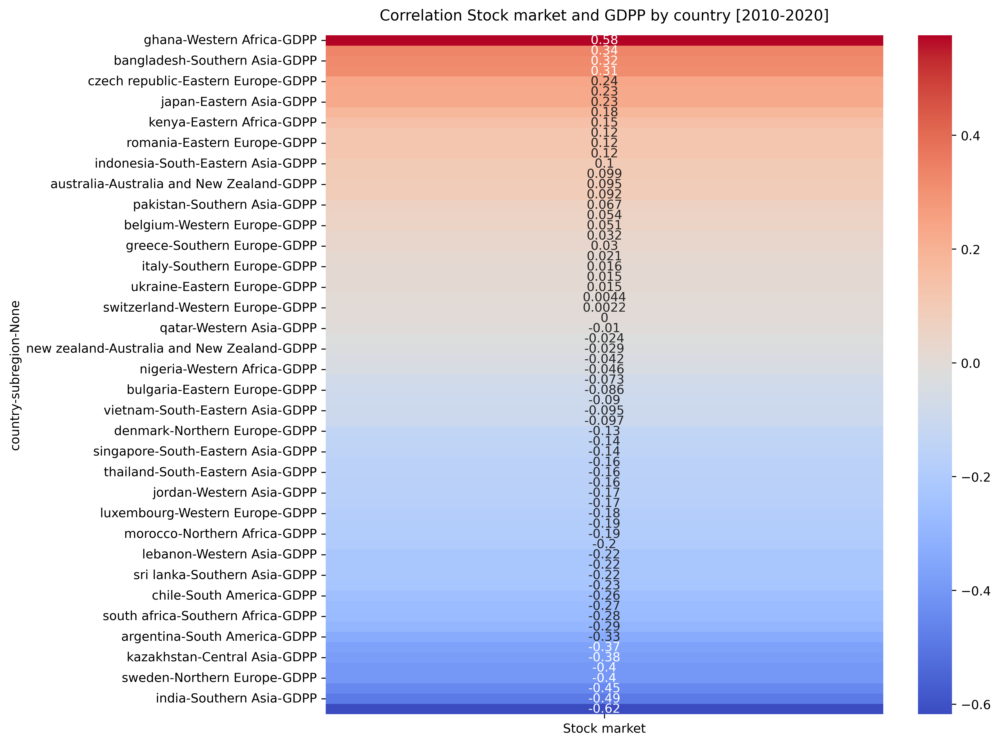

In [16]:
groupby_country= groupby_country.loc[ : , ['Stock market'] ] 
groupby_country = groupby_country.loc[ groupby_country['Stock market']!=1] 
groupby_country=groupby_country.sort_values(by='Stock market',ascending=False)
plt.figure(figsize=(10, 10),dpi=500)
sns.heatmap(groupby_country,annot = True, cmap = 'coolwarm')
plt.title('Correlation Stock market and GDPP by country [2010-2020]', fontdict={'fontsize':12}, pad=12);

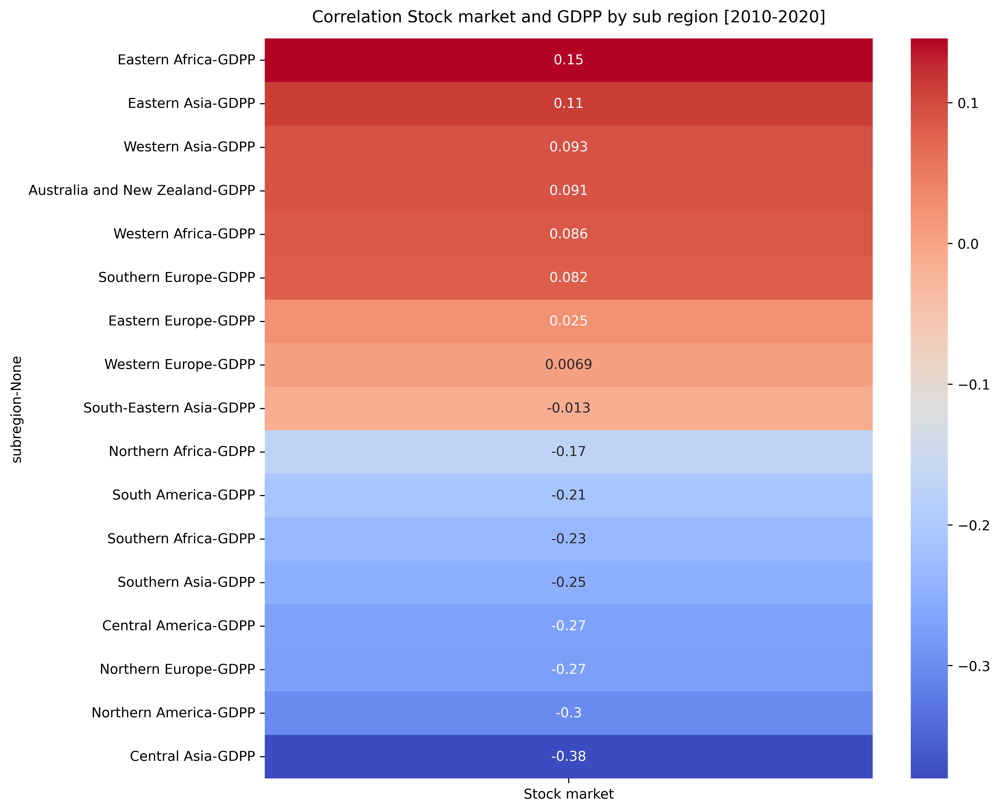

In [18]:
groupby_sregion= groupby_sregion.loc[ : , ['Stock market'] ] 
groupby_sregion = groupby_sregion.loc[ groupby_sregion['Stock market']!=1] 
groupby_sregion=groupby_sregion.sort_values(by='Stock market',ascending=False)
plt.figure(figsize=(10, 10),dpi=500)
sns.heatmap(groupby_sregion,annot = True, cmap = 'coolwarm')
plt.title('Correlation Stock market and GDPP by sub region [2010-2020]', fontdict={'fontsize':12}, pad=12);

# ความสัมพันธ์ของตลาดหุ้นสหรัฐ และประเทศอื่นๆ

In [19]:
#usa
us = df_stock.loc[ df_stock['country']=='united states']
inner_us=df_stock.merge(us, left_on='year', right_on='year')
inner_us = inner_us.merge(df_name,left_on='country_x',right_on='country')
inner_us.columns =['country' , 'year' , 'Stock market' ,'u.s.', 'Stock market of u.s.','country_1','region','subregion' ]
groupby_us_country = inner_us.groupby(['country','subregion'])
groupby_us_sregion = inner_us.groupby(['subregion'])

In [20]:
groupby_us_country = groupby_us_country.corr(method='spearman')
groupby_us_country

year  \
country       subregion                                                  
argentina     South America             year                  1.000000   
                                        Stock market          0.134906   
                                        Stock market of u.s.  0.259940   
australia     Australia and New Zealand year                  1.000000   
                                        Stock market          0.028994   
...                                                                ...   
united states Northern America          Stock market          0.259940   
                                        Stock market of u.s.  0.259940   
vietnam       South-Eastern Asia        year                  1.000000   
                                        Stock market          0.112970   
                                        Stock market of u.s.  0.259940   

                                                              Stock market  \
country       subregion                                                      
argentina     South America             year                      0.134906   
                                        Stock market              1.000000   
                                        Stock market of u.s.      0.742474   
australia     Australia and New Zealand year                      0.028994   
                                        Stock market              1.000000   
...                                                                    ...   
united states Northern America          Stock market              1.000000   
                                        Stock market of u.s.      0.944171   
vietnam       South-Eastern Asia        year                      0.112970   
                                        Stock market              1.000000   
                                        Stock market of u.s.      0.661193   

                                                              Stock market of u.s.  
country       subregion                                                             
argentina     South America             year                              0.259940  
                                        Stock market                      0.742474  
                                        Stock market of u.s.              1.000000  
australia     Australia and New Zealand year                              0.259940  
                                        Stock market                      0.757379  
...                                                                            ...  
united states Northern America          Stock market                      0.944171  
                                        Stock market of u.s.              1.000000  
vietnam       South-Eastern Asia        year                              0.259940  
                                        Stock market                      0.661193  
                                        Stock market of u.s.              1.000000  

[204 rows x 3 columns]

In [22]:
groupby_us_sregion = groupby_us_sregion.corr(method='spearman')
groupby_us_sregion

year  Stock market  \
subregion                                                                
Australia and New Zealand year                  1.000000      0.144159   
                          Stock market          0.144159      1.000000   
                          Stock market of u.s.  0.259940      0.737195   
Central America           year                  1.000000     -0.198571   
                          Stock market         -0.198571      1.000000   
                          Stock market of u.s.  0.259940      0.543625   
Central Asia              year                  1.000000      0.305495   
                          Stock market          0.305495      1.000000   
                          Stock market of u.s.  0.259940      0.428846   
Eastern Africa            year                  1.000000     -0.171634   
                          Stock market         -0.171634      1.000000   
                          Stock market of u.s.  0.259940      0.557925   
Eastern Asia              year                  1.000000      0.111056   
                          Stock market          0.111056      1.000000   
                          Stock market of u.s.  0.259940      0.588180   
Eastern Europe            year                  1.000000     -0.021443   
                          Stock market         -0.021443      1.000000   
                          Stock market of u.s.  0.259940      0.426708   
Northern Africa           year                  1.000000     -0.189655   
                          Stock market         -0.189655      1.000000   
                          Stock market of u.s.  0.259940      0.295630   
Northern America          year                  1.000000      0.136325   
                          Stock market          0.136325      1.000000   
                          Stock market of u.s.  0.259940      0.636312   
Northern Europe           year                  1.000000      0.080895   
                          Stock market          0.080895      1.000000   
                          Stock market of u.s.  0.259940      0.704891   
South America             year                  1.000000     -0.060026   
                          Stock market         -0.060026      1.000000   
                          Stock market of u.s.  0.259940      0.396663   
South-Eastern Asia        year                  1.000000     -0.230975   
                          Stock market         -0.230975      1.000000   
                          Stock market of u.s.  0.259940      0.501991   
Southern Africa           year                  1.000000     -0.232957   
                          Stock market         -0.232957      1.000000   
                          Stock market of u.s.  0.259940      0.548178   
Southern Asia             year                  1.000000     -0.183264   
                          Stock market         -0.183264      1.000000   
                          Stock market of u.s.  0.259940      0.519976   
Southern Europe           year                  1.000000      0.134919   
                          Stock market          0.134919      1.000000   
                          Stock market of u.s.  0.259940      0.628078   
Western Africa            year                  1.000000     -0.010458   
                          Stock market         -0.010458      1.000000   
                          Stock market of u.s.  0.259940      0.418650   
Western Asia              year                  1.000000     -0.155143   
                          Stock market         -0.155143      1.000000   
                          Stock market of u.s.  0.259940      0.381736   
Western Europe            year                  1.000000      0.055013   
                          Stock market          0.055013      1.000000   
                          Stock market of u.s.  0.259940      0.709850   

                                                Stock market of u.s.  
subregion                                                 

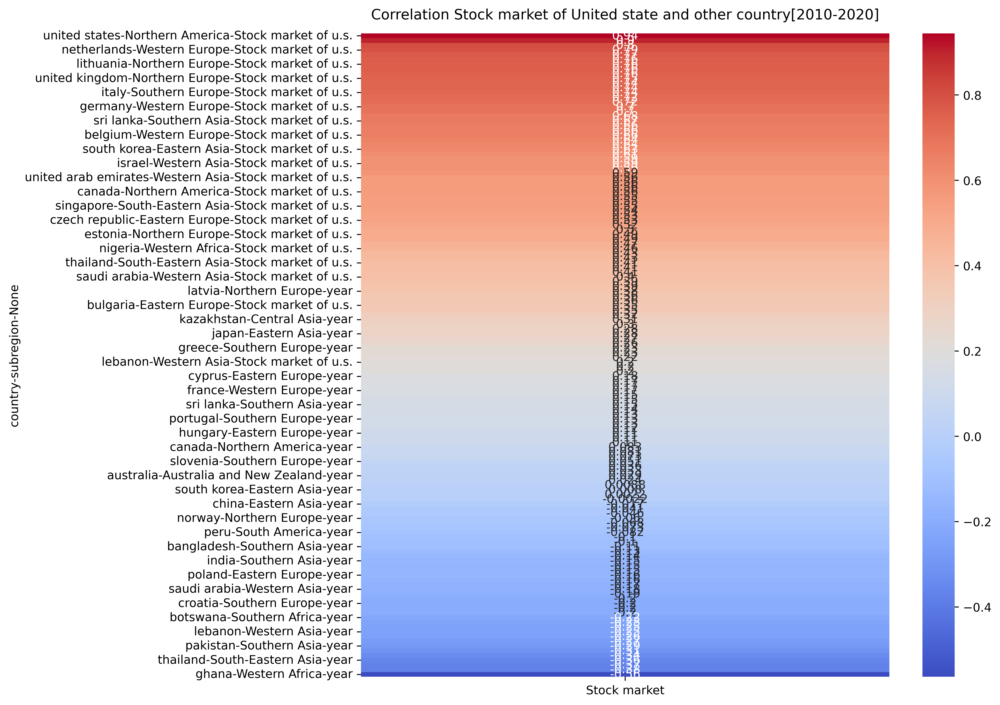

In [21]:
groupby_us_country= groupby_us_country.loc[ : , ['Stock market'] ] 
groupby_us_country = groupby_us_country.loc[ groupby_us_country['Stock market']!=1] 
groupby_us_country=groupby_us_country.sort_values(by='Stock market',ascending=False)
plt.figure(figsize=(10, 10),dpi=500)
sns.heatmap(groupby_us_country,annot = True, cmap = 'coolwarm')
plt.title('Correlation Stock market of United state and other country[2010-2020]', fontdict={'fontsize':12}, pad=12);

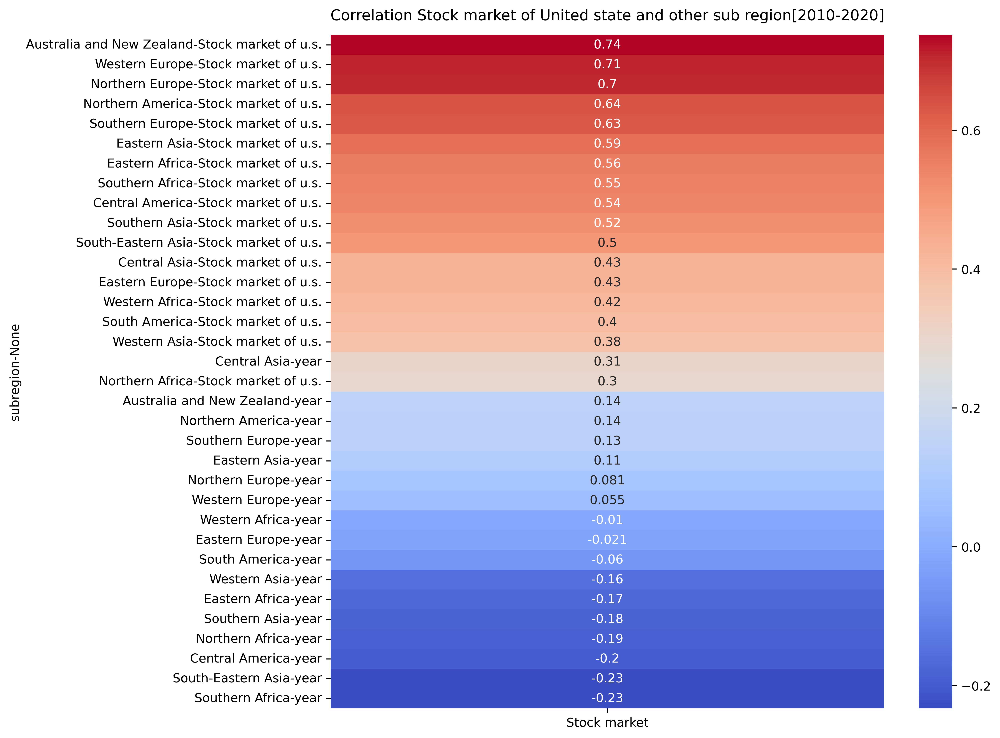

In [23]:
groupby_us_sregion= groupby_us_sregion.loc[ : , ['Stock market'] ] 
groupby_us_sregion = groupby_us_sregion.loc[ groupby_us_sregion['Stock market']!=1] 
groupby_us_sregion=groupby_us_sregion.sort_values(by='Stock market',ascending=False)
plt.figure(figsize=(10, 10),dpi=500)
sns.heatmap(groupby_us_sregion,annot = True, cmap = 'coolwarm')
plt.title('Correlation Stock market of United state and other sub region[2010-2020]', fontdict={'fontsize':12}, pad=12);

# ความสัมพันธ์ของตลาดหุ้นจีน และประเทศอื่นๆ

In [24]:
china = df_stock.loc[ df_stock['country']=='china']
inner_china=df_stock.merge(china, left_on='year', right_on='year')
inner_china = inner_china.merge(df_name,left_on='country_x',right_on='country')
inner_china.columns =['country' , 'year' , 'Stock market' ,'china', 'Stock market of china','country_1','region','subregion' ]
groupby_china_country = inner_china.groupby(['country'])
groupby_china_sregion = inner_china.groupby(['subregion'])

In [25]:
groupby_china_country = groupby_china_country.corr(method='spearman')
groupby_china_country

year  Stock market  \
country                                                       
argentina     year                   1.000000      0.134906   
              Stock market           0.134906      1.000000   
              Stock market of china -0.017299      0.477967   
australia     year                   1.000000      0.028994   
              Stock market           0.028994      1.000000   
...                                       ...           ...   
united states Stock market           0.259940      1.000000   
              Stock market of china -0.017299      0.534506   
vietnam       year                   1.000000      0.112970   
              Stock market           0.112970      1.000000   
              Stock market of china -0.017299      0.719078   

                                     Stock market of china  
country                                                     
argentina     year                               -0.017299  
              Stock market                        0.477967  
              Stock market of china               1.000000  
australia     year                               -0.017299  
              Stock market                        0.663182  
...                                                    ...  
united states Stock market                        0.534506  
              Stock market of china               1.000000  
vietnam       year                               -0.017299  
              Stock market                        0.719078  
              Stock market of china               1.000000  

[204 rows x 3 columns]

In [26]:
groupby_china_sregion = groupby_china_sregion.corr(method='spearman')
groupby_china_sregion

year  Stock market  \
subregion                                                                 
Australia and New Zealand year                   1.000000      0.144159   
                          Stock market           0.144159      1.000000   
                          Stock market of china -0.017299      0.595623   
Central America           year                   1.000000     -0.198571   
                          Stock market          -0.198571      1.000000   
                          Stock market of china -0.017299      0.547957   
Central Asia              year                   1.000000      0.305495   
                          Stock market           0.305495      1.000000   
                          Stock market of china -0.017299      0.484124   
Eastern Africa            year                   1.000000     -0.171634   
                          Stock market          -0.171634      1.000000   
                          Stock market of china -0.017299      0.286334   
Eastern Asia              year                   1.000000      0.111056   
                          Stock market           0.111056      1.000000   
                          Stock market of china -0.017299      0.575631   
Eastern Europe            year                   1.000000     -0.021443   
                          Stock market          -0.021443      1.000000   
                          Stock market of china -0.017299      0.488101   
Northern Africa           year                   1.000000     -0.189655   
                          Stock market          -0.189655      1.000000   
                          Stock market of china -0.017299      0.365079   
Northern America          year                   1.000000      0.136325   
                          Stock market           0.136325      1.000000   
                          Stock market of china -0.017299      0.444899   
Northern Europe           year                   1.000000      0.080895   
                          Stock market           0.080895      1.000000   
                          Stock market of china -0.017299      0.448168   
South America             year                   1.000000     -0.060026   
                          Stock market          -0.060026      1.000000   
                          Stock market of china -0.017299      0.393680   
South-Eastern Asia        year                   1.000000     -0.230975   
                          Stock market          -0.230975      1.000000   
                          Stock market of china -0.017299      0.561908   
Southern Africa           year                   1.000000     -0.232957   
                          Stock market          -0.232957      1.000000   
                          Stock market of china -0.017299      0.524467   
Southern Asia             year                   1.000000     -0.183264   
                          Stock market          -0.183264      1.000000   
                          Stock market of china -0.017299      0.595829   
Southern Europe           year                   1.000000      0.134919   
                          Stock market           0.134919      1.000000   
                          Stock market of china -0.017299      0.566332   
Western Africa            year                   1.000000     -0.010458   
                          Stock market          -0.010458      1.000000   
                          Stock market of china -0.017299      0.148424   
Western Asia              year                   1.000000     -0.155143   
                          Stock market          -0.155143      1.000000   
                          Stock market of china -0.017299      0.454360   
Western Europe            year                   1.000000      0.055013   
                          Stock market           0.055013      1.000000   
                          Stock market of china -0.017299      0.493130   

                                                 Stock market of china  
subr

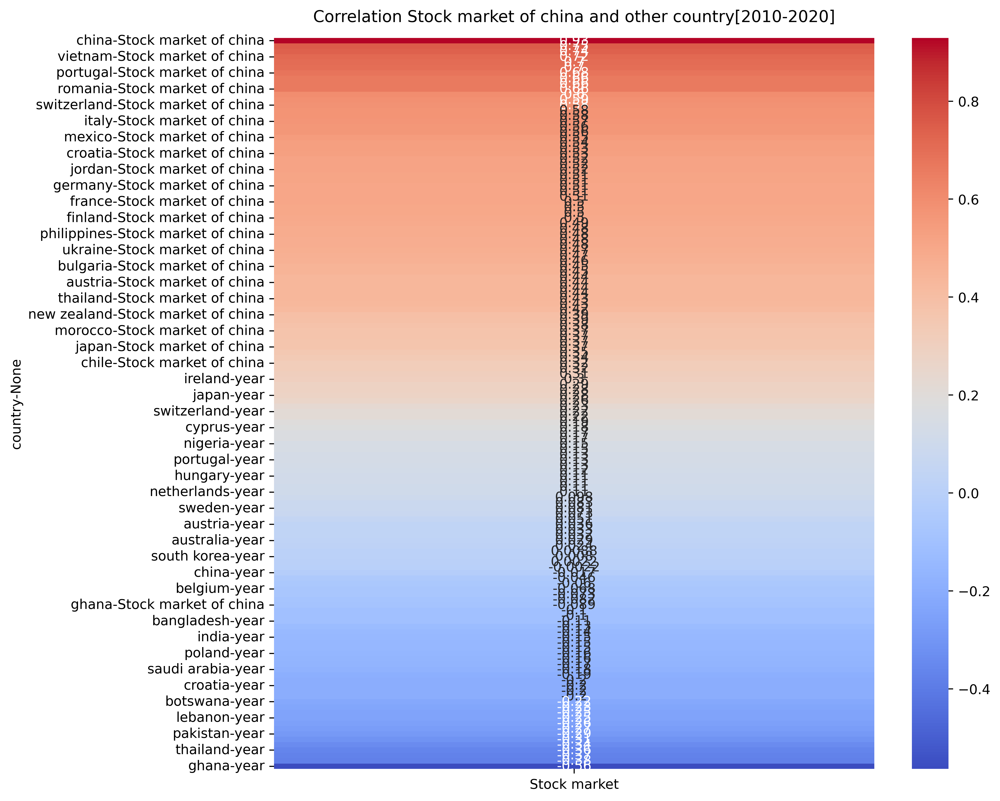

In [27]:
groupby_china_country= groupby_china_country.loc[ : , ['Stock market'] ] 
groupby_china_country = groupby_china_country.loc[ groupby_china_country['Stock market']!=1]
groupby_china_country=groupby_china_country.sort_values(by='Stock market',ascending=False)
plt.figure(figsize=(10, 10),dpi=500)
sns.heatmap(groupby_china_country,annot = True, cmap = 'coolwarm')
plt.title('Correlation Stock market of china and other country[2010-2020]', fontdict={'fontsize':12}, pad=12);

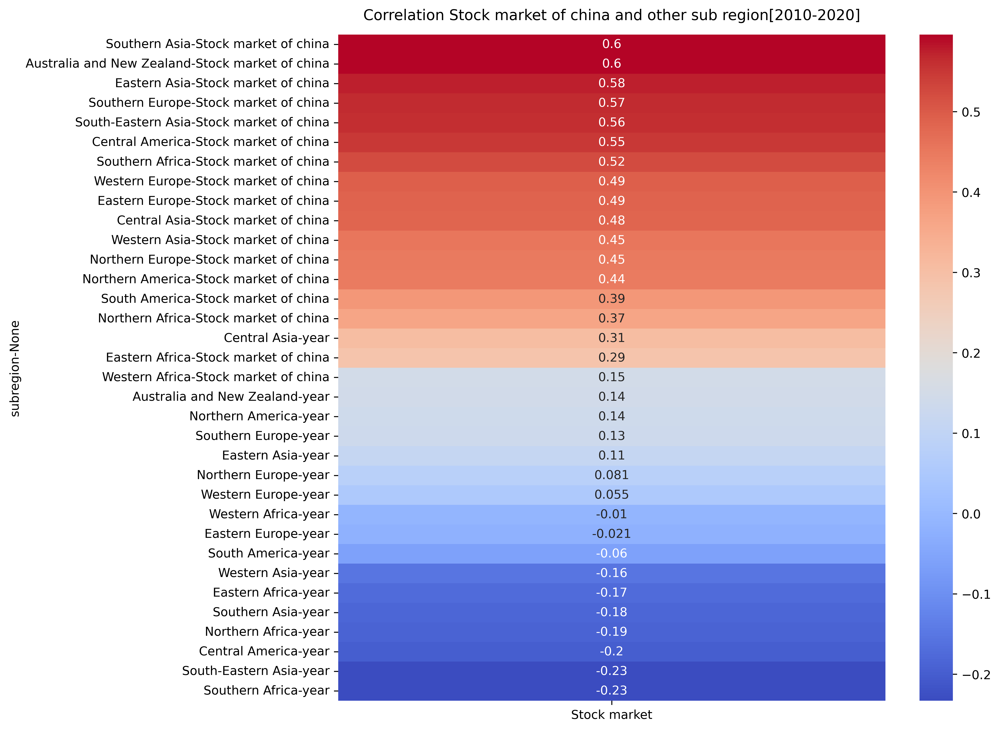

In [28]:
groupby_china_sregion= groupby_china_sregion.loc[ : , ['Stock market'] ] 
groupby_china_sregion = groupby_china_sregion.loc[ groupby_china_sregion['Stock market']!=1] 
groupby_china_sregion=groupby_china_sregion.sort_values(by='Stock market',ascending=False)
plt.figure(figsize=(10, 10),dpi=500)
sns.heatmap(groupby_china_sregion,annot = True, cmap = 'coolwarm')
plt.title('Correlation Stock market of china and other sub region[2010-2020]', fontdict={'fontsize':12}, pad=12);

# ความสัมพันธ์ของ GDP per capita ของสหรัฐ และประเทศอื่นๆ

In [29]:
#usa
us = df_gdp.loc[ df_gdp['country']=='united states']
inner_us=df_gdp.merge(us, left_on='year', right_on='year')
inner_us = inner_us.merge(df_name,left_on='country_x',right_on='country')
inner_us.columns =['country' , 'year' , 'GDPP' ,'u.s.', 'GDPP of u.s.','country_1','region','subregion' ]
groupby_us_country = inner_us.groupby(['country','subregion'])
groupby_us_sregion = inner_us.groupby(['subregion'])

In [30]:
groupby_us_country = groupby_us_country.corr(method='spearman')
groupby_us_country

year      GDPP  GDPP of u.s.
country     subregion                                                     
afghanistan Southern Asia   year          1.000000 -0.614286     -0.071429
                            GDPP         -0.614286  1.000000      0.075000
                            GDPP of u.s. -0.071429  0.075000      1.000000
albania     Southern Europe year          1.000000 -0.285714     -0.071429
                            GDPP         -0.285714  1.000000      0.385714
...                                            ...       ...           ...
zambia      Eastern Africa  GDPP         -0.617857  1.000000      0.357143
                            GDPP of u.s. -0.071429  0.357143      1.000000
zimbabwe    Eastern Africa  year          1.000000 -0.085714     -0.071429
                            GDPP         -0.085714  1.000000     -0.125000
                            GDPP of u.s. -0.071429 -0.125000      1.000000

[558 rows x 3 columns]

In [31]:
groupby_us_sregion = groupby_us_sregion.corr(method='spearman')
groupby_us_sregion

year      GDPP  GDPP of u.s.
subregion                                                               
Australia and New Zealand year          1.000000 -0.323566     -0.071429
                          GDPP         -0.323566  1.000000      0.265627
                          GDPP of u.s. -0.071429  0.265627      1.000000
Caribbean                 year          1.000000 -0.306510     -0.071429
                          GDPP         -0.306510  1.000000      0.359342
...                                          ...       ...           ...
Western Asia              GDPP         -0.502310  1.000000      0.357323
                          GDPP of u.s. -0.071429  0.357323      1.000000
Western Europe            year          1.000000 -0.363793     -0.071429
                          GDPP         -0.363793  1.000000      0.296173
                          GDPP of u.s. -0.071429  0.296173      1.000000

[66 rows x 3 columns]

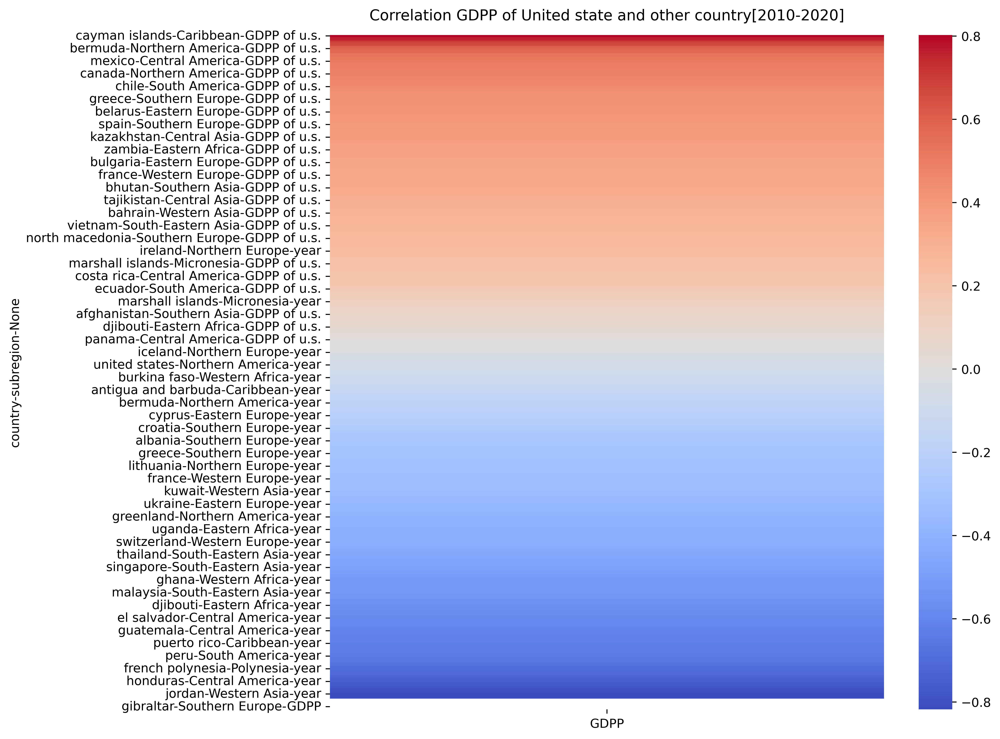

In [32]:
groupby_us_country= groupby_us_country.loc[ : , ['GDPP'] ] 
groupby_us_country = groupby_us_country.loc[ groupby_us_country['GDPP']!=1] 
groupby_us_country=groupby_us_country.sort_values(by='GDPP',ascending=False)
plt.figure(figsize=(10, 10),dpi=500)
sns.heatmap(groupby_us_country, cmap = 'coolwarm')
plt.title('Correlation GDPP of United state and other country[2010-2020]', fontdict={'fontsize':12}, pad=12);

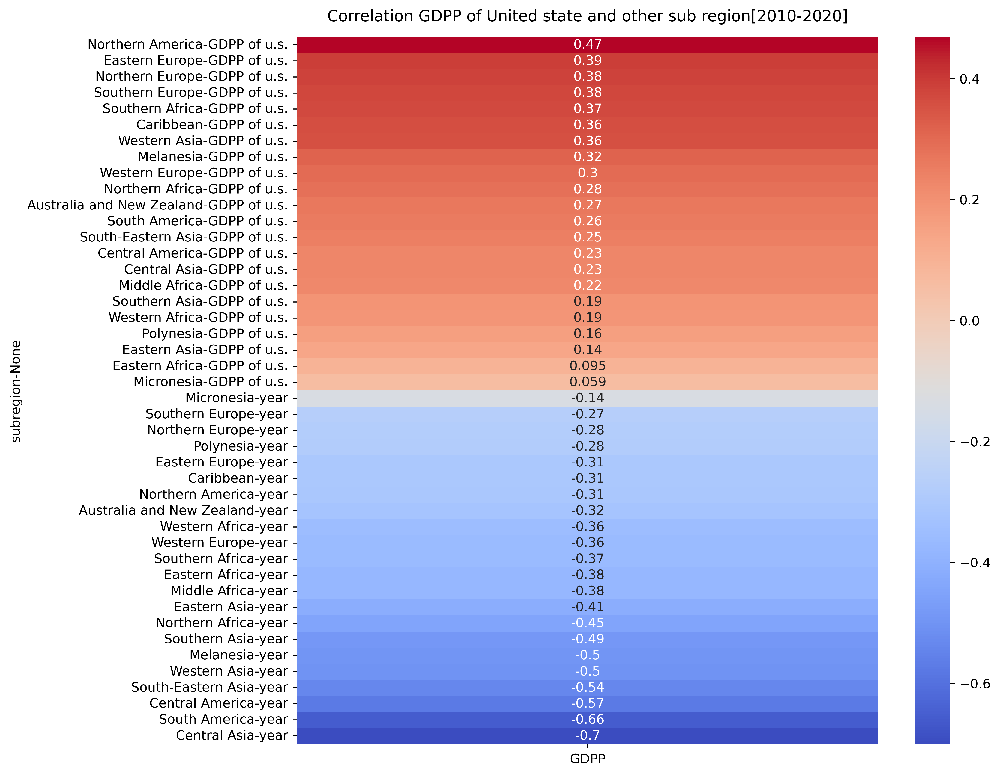

In [33]:
groupby_us_sregion= groupby_us_sregion.loc[ : , ['GDPP'] ] 
groupby_us_sregion = groupby_us_sregion.loc[ groupby_us_sregion['GDPP']!=1] 
groupby_us_sregion=groupby_us_sregion.sort_values(by='GDPP',ascending=False)
plt.figure(figsize=(10, 10),dpi=500)
sns.heatmap(groupby_us_sregion,annot = True, cmap = 'coolwarm')
plt.title('Correlation GDPP of United state and other sub region[2010-2020]', fontdict={'fontsize':12}, pad=12);

# ความสัมพันธ์ของ GDP per capita ของจีน และประเทศอื่นๆ

In [34]:
china = df_gdp.loc[ df_gdp['country']=='china']
inner_china=df_gdp.merge(china, left_on='year', right_on='year')
inner_china = inner_china.merge(df_name,left_on='country_x',right_on='country')
inner_china.columns =['country' , 'year' , 'GDPP' ,'china', 'GDPP of china','country_1','region','subregion' ]
groupby_china_country = inner_china.groupby(['country','subregion'])
groupby_china_sregion = inner_china.groupby(['subregion'])

In [35]:
groupby_china_country = groupby_china_country.corr(method ='spearman')
groupby_china_country

year      GDPP  GDPP of china
country     subregion                                                       
afghanistan Southern Asia   year           1.000000 -0.614286      -0.771429
                            GDPP          -0.614286  1.000000       0.532143
                            GDPP of china -0.771429  0.532143       1.000000
albania     Southern Europe year           1.000000 -0.285714      -0.771429
                            GDPP          -0.285714  1.000000       0.582143
...                                             ...       ...            ...
zambia      Eastern Africa  GDPP          -0.617857  1.000000       0.746429
                            GDPP of china -0.771429  0.746429       1.000000
zimbabwe    Eastern Africa  year           1.000000 -0.085714      -0.771429
                            GDPP          -0.085714  1.000000      -0.035714
                            GDPP of china -0.771429 -0.035714       1.000000

[558 rows x 3 columns]

In [36]:
groupby_china_sregion = groupby_china_sregion.corr(method ='spearman')
groupby_china_sregion

year      GDPP  GDPP of china
subregion                                                                 
Australia and New Zealand year           1.000000 -0.323566      -0.771429
                          GDPP          -0.323566  1.000000       0.632870
                          GDPP of china -0.771429  0.632870       1.000000
Caribbean                 year           1.000000 -0.306510      -0.771429
                          GDPP          -0.306510  1.000000       0.369811
...                                           ...       ...            ...
Western Asia              GDPP          -0.502310  1.000000       0.759496
                          GDPP of china -0.771429  0.759496       1.000000
Western Europe            year           1.000000 -0.363793      -0.771429
                          GDPP          -0.363793  1.000000       0.647428
                          GDPP of china -0.771429  0.647428       1.000000

[66 rows x 3 columns]

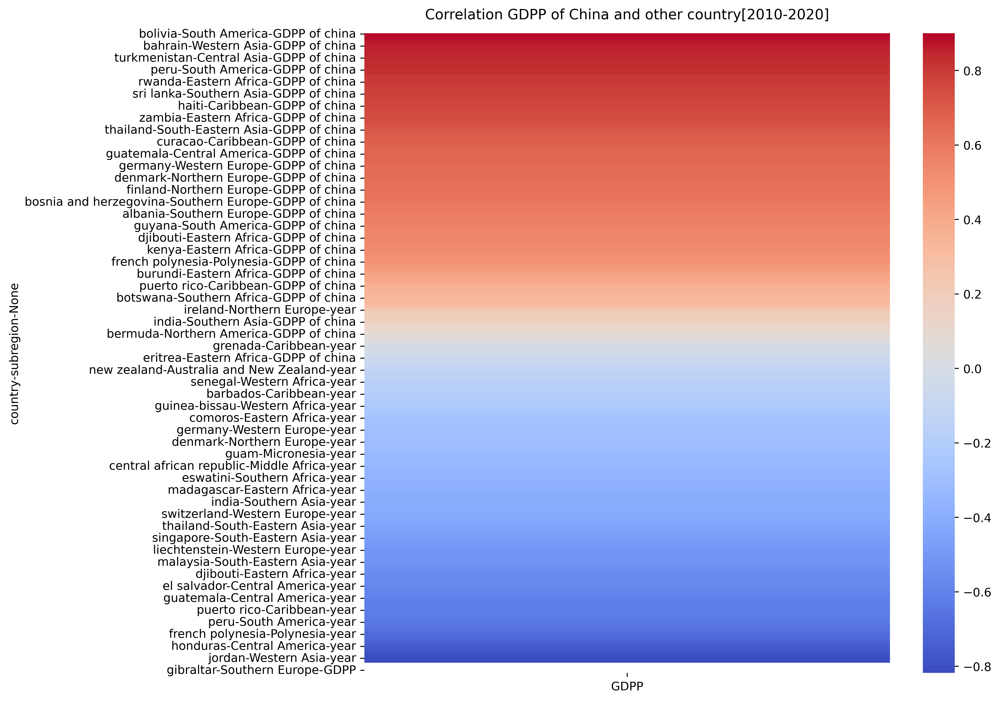

In [37]:
groupby_china_country= groupby_china_country.loc[ : , ['GDPP'] ] 
groupby_china_country = groupby_china_country.loc[ groupby_china_country['GDPP']!=1] 
groupby_china_country=groupby_china_country.sort_values(by='GDPP',ascending=False)
plt.figure(figsize=(10, 10),dpi=500)
sns.heatmap(groupby_china_country, cmap = 'coolwarm')
plt.title('Correlation GDPP of China and other country[2010-2020]', fontdict={'fontsize':12}, pad=12);

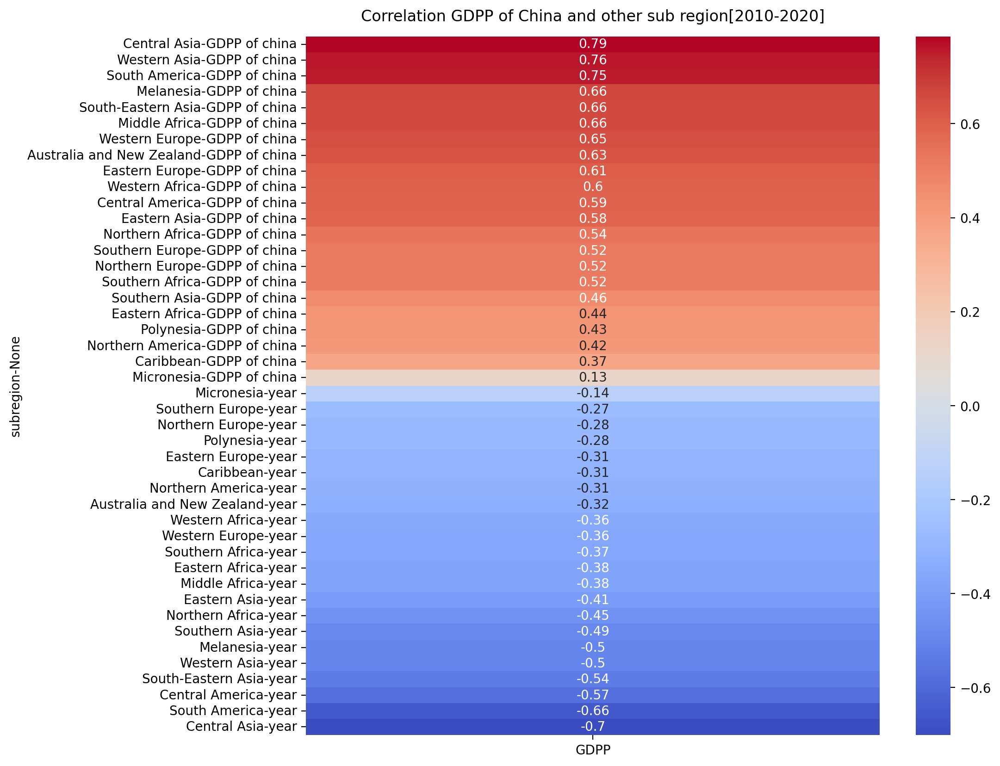

In [38]:
groupby_china_sregion = groupby_china_sregion.loc[ : , ['GDPP'] ] 
groupby_china_sregion = groupby_china_sregion.loc[ groupby_china_sregion['GDPP']!=1] 
groupby_china_sregion=groupby_china_sregion.sort_values(by='GDPP',ascending=False)
plt.figure(figsize=(10, 10),dpi=200)
sns.heatmap(groupby_china_sregion,annot = True, cmap = 'coolwarm')
plt.title('Correlation GDPP of China and other sub region[2010-2020]', fontdict={'fontsize':12}, pad=12);